In [1]:
import pandas as pd
import numpy as np

import datetime as dt

from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.utils import resample

import statsmodels.api as sm
import scipy.stats as stats

import pickle


import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)   
    
from src.sports_scrapers import scrape_huskies, scrape_seahawks
from src.weather_scraper import get_raw_forecast, get_raw_forecast_dataframe, get_hi_temperature, seattle_weather_fcst
from src.data_retrievers import DataRetrieval
from src.holiday_calendars import SeattleHolidays
from src.featurizers import (CountCalls, FeaturizeCalls, DateDummies, HolidayDummies, 
                             EventDummies, MakeDummies, JoinDataFrames, MakeModelInput)

import folium
from folium import GeoJson
import shapefile
import branca.colormap as cm
import json


import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
from sklearn.ensemble import (GradientBoostingRegressor, 
                              GradientBoostingClassifier, 
                              AdaBoostClassifier,
                              RandomForestClassifier)
from sklearn.svm import SVC
import sklearn.datasets as datasets
import sklearn.cross_validation as cv
from sklearn.ensemble.partial_dependence import partial_dependence, plot_partial_dependence
from sklearn.model_selection import RandomizedSearchCV
from mpl_toolkits.mplot3d import Axes3D

plt.style.use('ggplot')

from pylab import rcParams
rcParams['figure.figsize'] = (8.0, 6.0)

from IPython.display import HTML

/anaconda3/lib/python3.6/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [3]:
import pandas as pd
import numpy as np

from sklearn.pipeline import Pipeline

calls_pipe = Pipeline(steps=[
    ('counter', CountCalls(how='neighborhood')),
    ('feturizer', FeaturizeCalls()),
    ('date_dummifier', DateDummies()),
    ('model_input', MakeModelInput())
])

In [4]:
retriever = DataRetrieval()

In [5]:
calls = retriever.get_calls_data()

In [6]:
calls_pipe.fit(calls)

Pipeline(memory=None,
     steps=[('counter', <src.featurizers.CountCalls object at 0x10297f7b8>), ('feturizer', <src.featurizers.FeaturizeCalls object at 0x1c0c522e80>), ('date_dummifier', <src.featurizers.DateDummies object at 0x102a51080>), ('model_input', <src.featurizers.MakeModelInput object at 0x102a510f0>)])

In [7]:
calls_neighborhood = calls_pipe.transform(calls)

/Users/analyticallycorrect/galvanize/capstone/seattle_domestic_violence/src/data_retrievers.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  df['date'][i] = (f"{df.iloc[i]['Date']}, {df.iloc[i]['year']}")
/Users/analyticallycorrect/galvanize/capstone/seattle_domestic_violence/src/data_retrievers.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  df['seahawks_game'][i] = 'home_Regular'
/Users/analyticallycorrect/galvanize/capstone/seattle_domestic_violence/src/data_retrievers.py:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

In [8]:
targets = calls_neighborhood.pivot_table(values='num_calls',index='date', columns='neighborhood')

features = calls_neighborhood.drop(columns=['neighborhood', 'date', 'num_calls', 'dt_time','year', 
                                                    'month', 'day','day_of_week', 'month_day','month_weekday',
                                                    'spec_day']).drop_duplicates()

In [12]:
X_train, X_test, y_train, y_test =  train_test_split(features, targets,
                                                     test_size=0.2, random_state=157)


# Baseline Modle

In [93]:
b_targets = calls_neighborhood.pivot_table(values='num_calls',index='date', columns='neighborhood')

In [94]:
b_features = calls_neighborhood['day_seq'].drop_duplicates()

In [95]:
X_train_b, X_test_b, y_train_b, y_test_b =  train_test_split(b_features, b_targets,
                                                                 test_size=0.2, random_state=157)

X_train_b = np.array(X_train_b).reshape(-1, 1)
X_test_b = np.array(X_test_b).reshape(-1, 1)

In [96]:
neighborhood_model_b = LinearRegression()

In [97]:
neighborhood_model_b.fit(X_train_b, y_train_b)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [98]:
neighborhood_b_train_predictions = neighborhood_model_b.predict(X_train_b)
neighborhood_b_train_mse = mean_squared_error(y_train_b, neighborhood_b_train_predictions)

neighborhood_b_test_predictions = neighborhood_model_b.predict(X_test_b)
neighborhood_b_test_mse = mean_squared_error(y_test_b, neighborhood_b_test_predictions)

In [99]:
neighborhood_b_train_mse, neighborhood_b_test_mse

(0.5616549646134867, 0.5672616233277288)

In [100]:
neighborhood_model_b.score(X_train_b, y_train_b)

0.004964196467862284

# City Model - GBRT

In [280]:
# Fit a model with optimal values to look at various diagnostic plots

model_city = GradientBoostingRegressor(n_estimators=752, learning_rate=0.01, max_depth=3, subsample=0.6)
model_city.fit(X_train.drop(columns=['precip^2', 'snow^2']), y_train.sum(axis=1))

GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
             learning_rate=0.01, loss='ls', max_depth=3, max_features=None,
             max_leaf_nodes=None, min_impurity_decrease=0.0,
             min_impurity_split=None, min_samples_leaf=1,
             min_samples_split=2, min_weight_fraction_leaf=0.0,
             n_estimators=752, presort='auto', random_state=None,
             subsample=0.6, verbose=0, warm_start=False)

In [293]:
feat_scores_boost_c = pd.DataFrame({'Fraction of Samples Affected' : model_city.feature_importances_},
                           index=X_train.drop(columns=['precip^2', 'snow^2']).columns)
feat_scores_boost_c = feat_scores_boost_c.sort_values(by='Fraction of Samples Affected')

In [311]:
feat_scores_boost_c = feat_scores_boost_c.round(decimals=2)

In [329]:
feat_scores_boost_c.plot(kind='barh', figsize=(20,500), fontsize=20)

In [411]:
feat_scores_boost_c_top10 = (feat_scores_boost_c.sort_values(by='Fraction of Samples Affected', ascending=False)[0:10]).sort_values(by='Fraction of Samples Affected').reset_index()


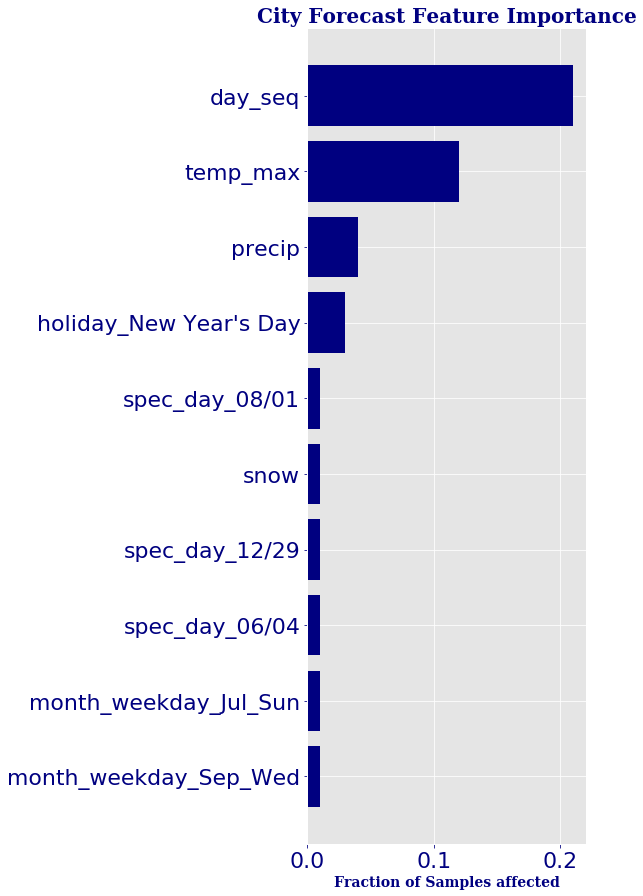

In [426]:
fig, ax = plt.subplots(figsize=(5,15))

ax.barh(feat_scores_boost_c_top10['index'], feat_scores_boost_c_top10['Fraction of Samples Affected'], color='Navy')
ax.set_xlabel('Fraction of Samples affected', fontdict={'family': 'serif','color':  'Navy','weight': 'bold','size': 14})
ax.set_title('City Forecast Feature Importance', fontdict={'family': 'serif','color':  'Navy','weight': 'bold','size': 20,})
ax.tick_params(direction='out', labelsize=22, colors='Navy')
plt.savefig('../plots/city_forecast_features.png', bbox_inches='tight')
plt.show()

In [283]:
model_city.score(X_train.drop(columns=['precip^2', 'snow^2']), y_train.sum(axis=1))

0.28885199625392655

In [285]:
mean_squared_error(y_train.sum(axis=1), model_city.predict(X_train.drop(columns=['precip^2', 'snow^2']))), mean_squared_error(y_test.sum(axis=1), model_city.predict(X_test.drop(columns=['precip^2', 'snow^2'])))

(29.748340413161163, 34.04776564354598)

In [286]:
train_pred_city = model_city.predict(X_train.drop(columns=['precip^2', 'snow^2']))
test_pred_city = model_city.predict(X_test.drop(columns=['precip^2', 'snow^2']))

In [ ]:
RandomForestRegressor()

# Neighborhood Distribution - Random Forest


In [19]:
neighborhood_dist_train = pd.DataFrame(np.array(y_train.T) / np.array(y_train.sum(axis=1))).T
neighborhood_dist_test = pd.DataFrame(np.array(y_test.T) / np.array(y_test.sum(axis=1))).T

In [287]:
rf_dist = RandomForestRegressor(n_estimators=10000, min_samples_split=5,
                                min_samples_leaf=1, max_features='auto', 
                                max_depth=10, bootstrap=True)

In [288]:
rf_dist.fit(X_train.drop(columns=['precip^2', 'snow^2']), neighborhood_dist_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=10,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=5,
           min_weight_fraction_leaf=0.0, n_estimators=10000, n_jobs=1,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [289]:
train_pred_dist = rf_dist.predict(X_train.drop(columns=['precip^2', 'snow^2']))
test_pred_dist = rf_dist.predict(X_test.drop(columns=['precip^2', 'snow^2']))

mean_squared_error(neighborhood_dist_train, train_pred_dist), mean_squared_error(neighborhood_dist_test, test_pred_dist)

(0.0005991322553001753, 0.000633675449738873)

In [290]:
rf_dist.score(X_train.drop(columns=['precip^2', 'snow^2']), neighborhood_dist_train)

0.04963392580639519

In [406]:
# Plot the feature importance for city level rf
feat_scores_dist = pd.DataFrame({'Fraction of Samples Affected' : rf_dist.feature_importances_},
                           index=X_train.drop(columns=['precip^2', 'snow^2']).columns)
feat_scores_dist = feat_scores_dist.sort_values(by='Fraction of Samples Affected')

In [413]:
feat_scores_dist_top10 = (feat_scores_dist.sort_values(by='Fraction of Samples Affected', ascending=False)[0:10]).sort_values(by='Fraction of Samples Affected').reset_index()

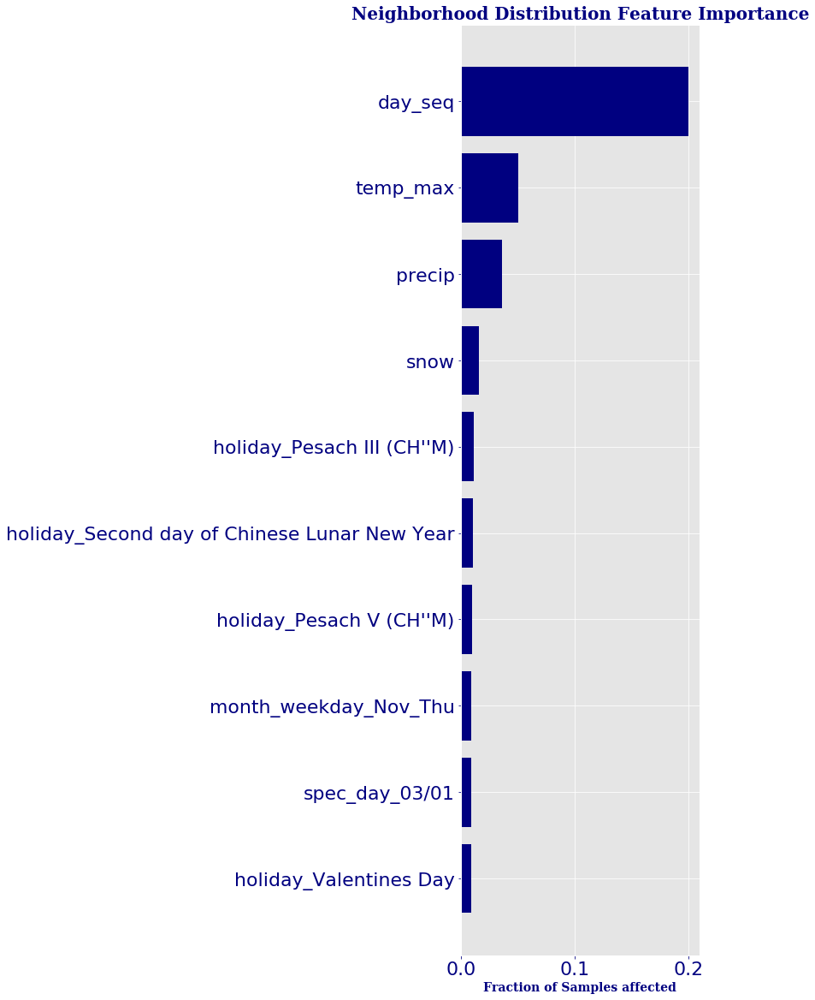

In [430]:
fig, ax = plt.subplots(figsize=(5,20))

ax.barh(feat_scores_dist_top10['index'], feat_scores_dist_top10['Fraction of Samples Affected'], color='Navy')
ax.set_xlabel('Fraction of Samples affected', fontdict={'family': 'serif','color':  'Navy','weight': 'bold','size': 14})
ax.set_title('Neighborhood Distribution Feature Importance', fontdict={'family': 'serif','color':  'Navy','weight': 'bold','size': 20,})
ax.tick_params(direction='out', labelsize=22, colors='Navy')
plt.savefig('../plots/neighborhood_dist_features.png', bbox_inches='tight')
plt.show()

# Combine Models 

In [331]:
train_pred_comb = train_pred_city * neighborhood_dist_train.T
test_pred_comb = test_pred_city * neighborhood_dist_test.T


In [332]:

mean_squared_error(y_train, train_pred_comb.T), mean_squared_error(y_test, test_pred_comb.T)

(0.03295498554103842, 0.037267067191800084)

In [334]:
graph_pred_comb = model_city.predict(features.drop(columns=['precip^2', 'snow^2']))

In [335]:
graph_act = calls_neighborhood.pivot_table(values='num_calls',index='date', columns='neighborhood').sum(axis=1)


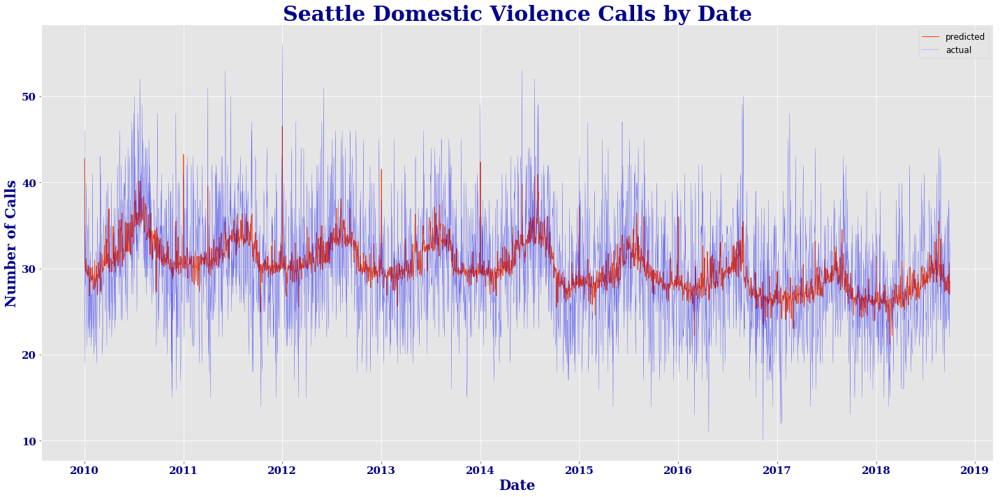

In [336]:
fig, axs = plt.subplots(1, figsize=(20,10))

axs.plot(graph_act.index, graph_pred_comb, lw=1, color='orangered')
axs.plot(graph_act.index, graph_act, lw=0.2, color='blue')
axs.set_title('Seattle Domestic Violence Calls by Date', fontdict={'family': 'serif','color':  'darkblue','weight': 'bold','size': 30,})
axs.set_ylabel('Number of Calls', fontdict={'family': 'serif','color':  'darkblue','weight': 'semibold','size': 20,})
axs.set_yticklabels(list(range(0, 70, 10)), fontdict={'family': 'serif','color':  'darkblue','weight': 'semibold','size': 15,})
axs.set_xticklabels(list(range(2010, 2020)), fontdict={'family': 'serif','color':  'darkblue','weight': 'semibold','size': 15,})
axs.legend(['predicted', 'actual'], fontsize = 'large')
axs.set_xlabel('Date', fontdict={'family': 'serif','color':  'darkblue','weight': 'semibold','size': 20,})
fig.tight_layout()

In [31]:
weather_avg = pd.read_csv('../data/weather_averages.csv')

weather_fcst = weather_avg[['DATE', 'DLY-TMAX-NORMAL', 'DLY-PRCP-50PCTL', 'DLY-SNOW-50PCTL']]

weather_fcst['DATE'] = pd.to_datetime(weather_fcst['DATE'].astype('str'), format='%Y%m%d', errors='ignore')

weather_fcst['month_day'] = weather_fcst['DATE'].dt.strftime('%m/%d')

weather_fcst = (weather_fcst[['month_day', 'DLY-PRCP-50PCTL', 'DLY-TMAX-NORMAL', 'DLY-SNOW-50PCTL']]
                .rename(columns={'DLY-PRCP-50PCTL':'precip', 'DLY-TMAX-NORMAL':'temp_max',
                                 'DLY-SNOW-50PCTL':'snow'}))
weather_fcst['snow'] = 0.0
weather_fcst['precip^2'] = weather_fcst['precip']**2
weather_fcst['snow^2'] = weather_fcst['snow']**2      



/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys


In [32]:
def featurize_dates(start_date, end_date, model_end):

    num_days = int(np.timedelta64(pd.to_datetime(end_date) - pd.to_datetime(start_date), 'D') / np.timedelta64(1,'D'))+1
    dates = [(pd.to_datetime(start_date) + np.timedelta64(i,'D')) for i in range(num_days)]
    start_seq = int((np.timedelta64(pd.to_datetime(start_date) - pd.to_datetime(model_end[0]), 'D') + model_end[1]) / np.timedelta64(1,'D'))
    df = pd.DataFrame({'dt_time': dates, 'day_seq':np.arange(start_seq, start_seq+num_days)})
    df['date'] = df['dt_time'].dt.date

    df['year'] = df['dt_time'].dt.year
    df['month'] = df['dt_time'].dt.month
    df['day'] = df['dt_time'].dt.day
    df['day_of_week'] = df['dt_time'].dt.weekday
    df['month_day'] = df['dt_time'].dt.strftime('%m/%d')
    df['month_weekday'] = df['dt_time'].dt.strftime('%b_%a')
    df['month'] = df['dt_time'].dt.strftime('%m/%d')     
    return df

In [36]:
start_date = '12/03/2018'
end_date = '12/31/2019'
model_end = ('09/30/2018', 3194)

In [37]:
forecast_data = featurize_dates(start_date, end_date, model_end)

In [39]:
forecast_pipe = Pipeline(steps=[
    ('date_dummifier', DateDummies()),
    ('model_input', MakeModelInput())
])

In [40]:
forecast_pipe.fit(forecast_data)

Pipeline(memory=None,
     steps=[('date_dummifier', <src.featurizers.DateDummies object at 0x1c226f8d30>), ('model_input', <src.featurizers.MakeModelInput object at 0x1c2272f518>)])

In [340]:
forecast_features = forecast_pipe.transform(forecast_data)

/Users/analyticallycorrect/galvanize/capstone/seattle_domestic_violence/src/data_retrievers.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  df['date'][i] = (f"{df.iloc[i]['Date']}, {df.iloc[i]['year']}")
/Users/analyticallycorrect/galvanize/capstone/seattle_domestic_violence/src/data_retrievers.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  df['seahawks_game'][i] = 'home_Regular'
/Users/analyticallycorrect/galvanize/capstone/seattle_domestic_violence/src/data_retrievers.py:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

In [44]:
forecast_dates = forecast_features[['dt_time', 'month_day']]

In [45]:
weather_fcst = forecast_dates.join(weather_fcst.set_index('month_day'), on='month_day')

In [46]:
near_term_weather = seattle_weather_fcst()


In [47]:
for i in range(len(near_term_weather)):
    weather_fcst['temp_max'][weather_fcst['dt_time'] == near_term_weather['date'][i]] = near_term_weather['temp_max'][i]
    if near_term_weather['precip_bool'][i]==0:
        weather_fcst['precip'][weather_fcst['dt_time'] == near_term_weather['date'][0]] = 0
        weather_fcst['precip^2'][weather_fcst['dt_time'] == near_term_weather['date'][0]] = 0

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


In [346]:
forecast_features[['precip', 'temp_max', 'snow']] = weather_fcst[['precip', 'temp_max', 'snow']]

In [348]:
forecast_predictions = model_city.predict(forecast_features.drop(columns=['dt_time', 'date', 'year','month',
                                                                          'day','day_of_week', 'month_day',
                                                                          'month_weekday','spec_day', 'precip^2', 'snow^2']))

In [349]:
results = pd.DataFrame({'date': forecast_dates['dt_time'], 'forecast_pred':forecast_predictions})

In [350]:
results.to_csv('../data/city_predictions.csv', index=False)

In [351]:
min(results['forecast_pred']), max(results['forecast_pred'])

(23.42682428202438, 33.70348785556766)

In [481]:
forecast_features.iloc[4][forecast_features.iloc[4]==1]

day_7                          1
month_weekday_Dec_Fri          1
holiday_Chanukah: 6 Candles    1
Name: 4, dtype: object

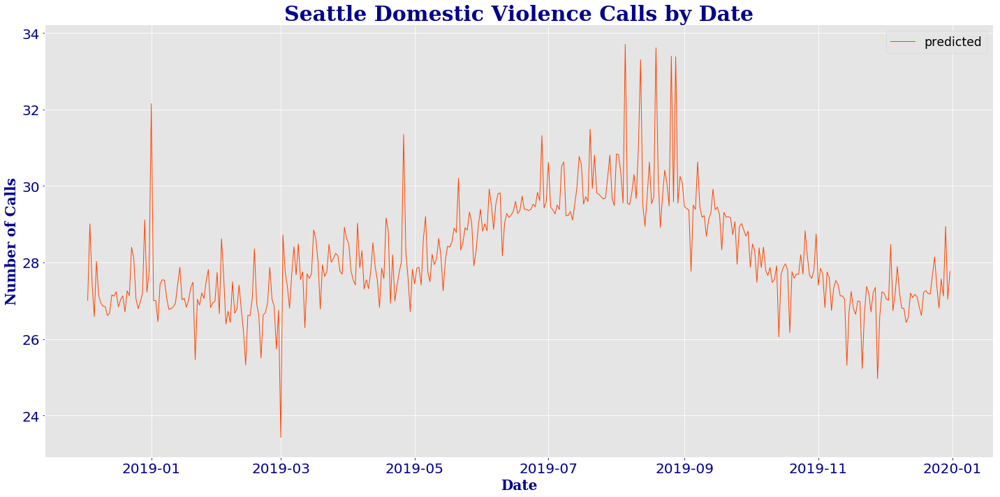

In [353]:
fig, axs = plt.subplots(1, figsize=(20,10))

axs.plot(results['date'], results['forecast_pred'], lw=1, color='orangered')
axs.set_title('Seattle Domestic Violence Calls by Date', fontdict={'family': 'serif','color':  'darkblue','weight': 'bold','size': 30,})
axs.set_ylabel('Number of Calls', fontdict={'family': 'serif','color':  'darkblue','weight': 'semibold','size': 20,})
axs.legend(['predicted'], fontsize = 'xx-large')
axs.tick_params(direction='out', labelsize=20, colors='darkblue')
axs.set_xlabel('Date', fontdict={'family': 'serif','color':  'darkblue','weight': 'semibold','size': 20,})
plt.savefig('../plots/seattle_forecast.png', bbox_inches='tight')
fig.tight_layout()

In [355]:
neighborhood_predictions = rf_dist.predict(forecast_features.drop(columns=['dt_time', 'date', 'year','month',
                                                                           'day','day_of_week', 'month_day',
                                                                           'month_weekday','spec_day', 'precip^2', 'snow^2']))

In [356]:
neighborhood_predicted_counts = results['forecast_pred'].values.copy() * neighborhood_predictions.T

In [357]:
neighborhood_predicted_counts = pd.DataFrame(neighborhood_predicted_counts.T, columns=targets.columns)

In [358]:
neighborhood_predicted_counts = neighborhood_predicted_counts.join(results['date'])

In [359]:
neighborhood_predicted_counts.to_csv('../data/neighborhood_predictions.csv', index=False)

In [360]:
neighborhood_means = neighborhood_predicted_counts.mean()

In [361]:
neighborhood_std = neighborhood_predicted_counts.std()

In [462]:
ratings = (((neighborhood_means - neighborhood_predicted_counts.drop('date', axis=1)) / (neighborhood_std*2)) + .5)

In [463]:
ratings.reset_index(inplace=True)

In [466]:
ratings = ratings.join(results['date'])

In [365]:
ratings.to_csv('../data/neighborhood_ratings.csv', index=False)

In [366]:
with open("../data/seattle_neighborhood_shapes.geojson") as f:
    mcpp_neighoborhoods = json.load(f)

In [367]:
neighborhood_ratings = pd.read_csv('../data/neighborhood_ratings.csv')

In [368]:
def my_color_function(feature, date_idx):
    """Maps low values to green and hugh values to red."""
    try:
        rating = ratings.iloc[date_idx][feature['properties']['name']]
        return rating
    except KeyError:
        return 0.5

In [369]:
def map_seattle(query_date=dt.date.today().strftime("%m/%d/%Y")):
    date_idx = (int((pd.to_datetime(neighborhood_ratings['date'])[pd.to_datetime(neighborhood_ratings['date'])==pd.to_datetime(query_date)].index).values))
    
    linear = cm.linear.RdYlGn_06
    seattle_neighborhoods = folium.Map(location=[47.606, -122.3321],
                                       zoom_start=11,tiles='cartodbpositron')
    
    GeoJson(mcpp_neighoborhoods,
        style_function=lambda feature: {
        'fillColor': linear(my_color_function(feature, date_idx)),
        'fillOpacity': 0.5,
        'color': 'gray',
        'dashArray': '5, 5'}).add_to(seattle_neighborhoods)
    display(seattle_neighborhoods)

In [432]:
(int((pd.to_datetime(neighborhood_ratings['date'])[pd.to_datetime(neighborhood_ratings['date'])==pd.to_datetime('01/01/2019')].index).values))

29

In [370]:
#need to combine North Capital Hill in Capital Hill

In [371]:
cm.linear.RdYlGn_06

In [480]:
forecast_features.drop(columns='date')

,dt_time,day_seq,year,month,day,day_of_week,month_day,month_weekday,spec_day,day_1,...,local_event_Womens March,seahawks_game_SuperBowl,seahawks_game_away_Playoffs,seahawks_game_away_Regular,seahawks_game_home_Playoffs,seahawks_game_home_Regular,huskies_game_away,huskies_game_home,sounders_game_away,sounders_game_home
0,2018-12-03,3258,2018,12/03,3,0,12/03,Dec_Mon,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2018-12-04,3259,2018,12/04,4,1,12/04,Dec_Tue,12/04,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2018-12-05,3260,2018,12/05,5,2,12/05,Dec_Wed,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2018-12-06,3261,2018,12/06,6,3,12/06,Dec_Thu,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2018-12-07,3262,2018,12/07,7,4,12/07,Dec_Fri,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,2018-12-08,3263,2018,12/08,8,5,12/08,Dec_Sat,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
6,2018-12-09,3264,2018,12/09,9,6,12/09,Dec_Sun,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,2018-12-10,3265,2018,12/10,10,0,12/10,Dec_Mon,0,0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
8,2018-12-11,3266,2018,12/11,11,1,12/11,Dec_Tue,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,2018-12-12,3267,2018,12/12,12,2,12/12,Dec_Wed,12/12,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [472]:
ratings.drop(columns='date').iloc[4]


index                               4.000000
ALASKA JUNCTION                     0.197234
ALKI                                0.709471
BALLARD NORTH                       0.473122
BALLARD SOUTH                       0.637225
BELLTOWN                            0.572636
BITTERLAKE                          0.704891
BRIGHTON/DUNLAP                     0.665478
CAPITOL HILL                        0.312350
CENTRAL AREA/SQUIRE PARK            0.796667
CHINATOWN/INTERNATIONAL DISTRICT    0.698409
CLAREMONT/RAINIER VISTA             0.136214
COLUMBIA CITY                       0.441872
COMMERCIAL DUWAMISH                 0.649785
COMMERCIAL HARBOR ISLAND            0.689909
DOWNTOWN COMMERCIAL                 0.371246
EASTLAKE - EAST                     0.619547
EASTLAKE - WEST                     0.621671
FAUNTLEROY SW                       0.663018
FIRST HILL                          0.862819
FREMONT                             0.266490
GENESEE                             0.628300
GEORGETOWN

In [483]:
map_seattle('12/07/2018')

In [49]:
import os.path

file_path = "rf1.pkl"
n_bytes = 2**31
max_bytes = 2**31 - 1
data = bytearray(n_bytes)

## write
bytes_out = pickle.dumps(rf)
with open(file_path, 'wb') as f_out:
    for idx in range(0, len(bytes_out), max_bytes):
        f_out.write(bytes_out[idx:idx+max_bytes])